In [4]:
from google.colab import drive


drive.mount('/content/drive') # noqa

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
%cd '/content/drive/MyDrive/CourseWork/MusicDecomposition'

/content/drive/MyDrive/CourseWork/MusicDecomposition


In [11]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import librosa
import librosa.display

In [ ]:
def display_spectrogram(module_path, rate = 8192) -> None:
    plt.figure(figsize=(14, 8))
    modules = np.load(module_path)
    db_scaled_modules = librosa.amplitude_to_db(modules, ref=np.max)
    librosa.display.specshow(db_scaled_modules, sr=rate, x_axis="time", y_axis="hz")
    plt.plot(format="%+2.f dB")
    plt.title(module_path)
    plt.show()

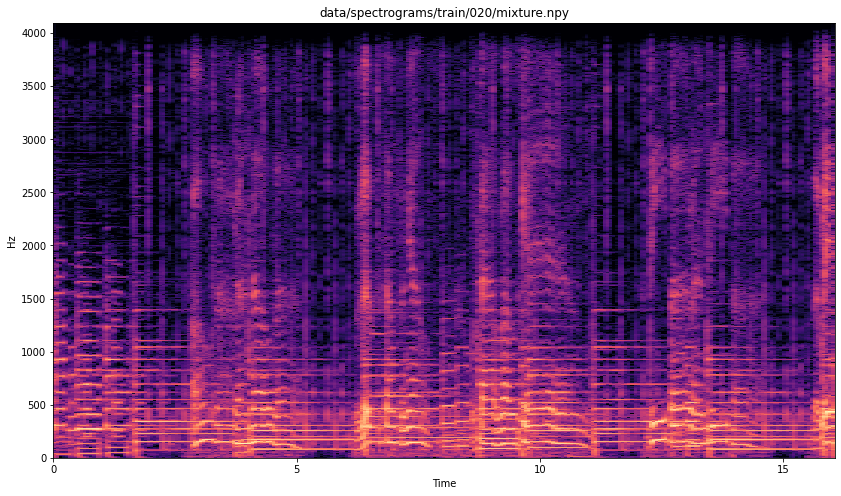

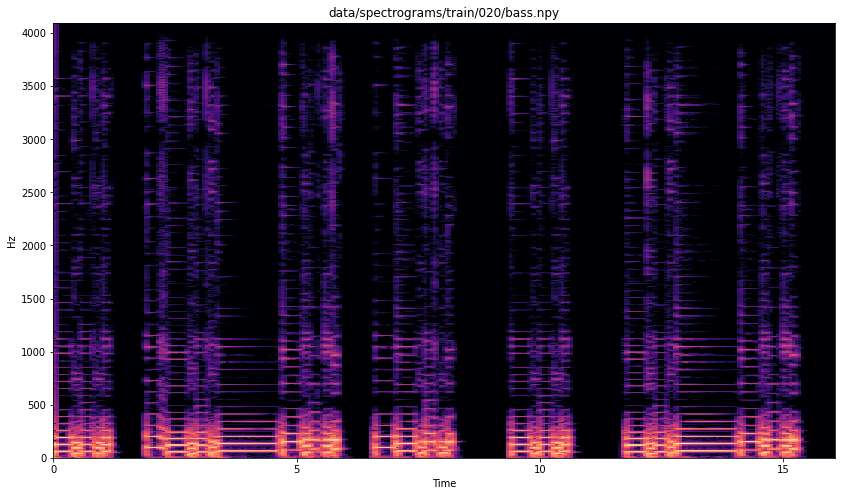

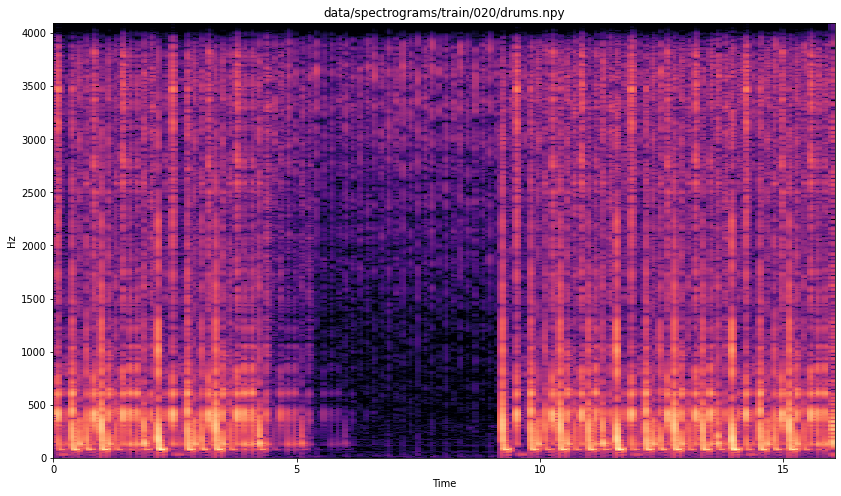

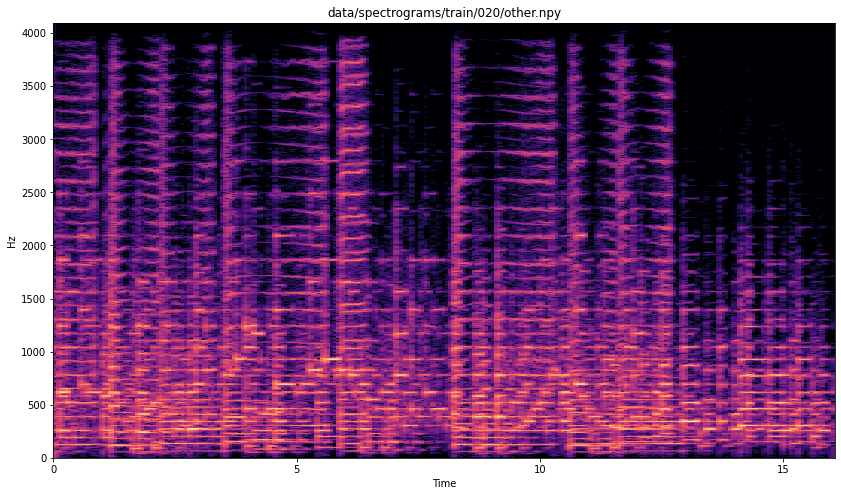

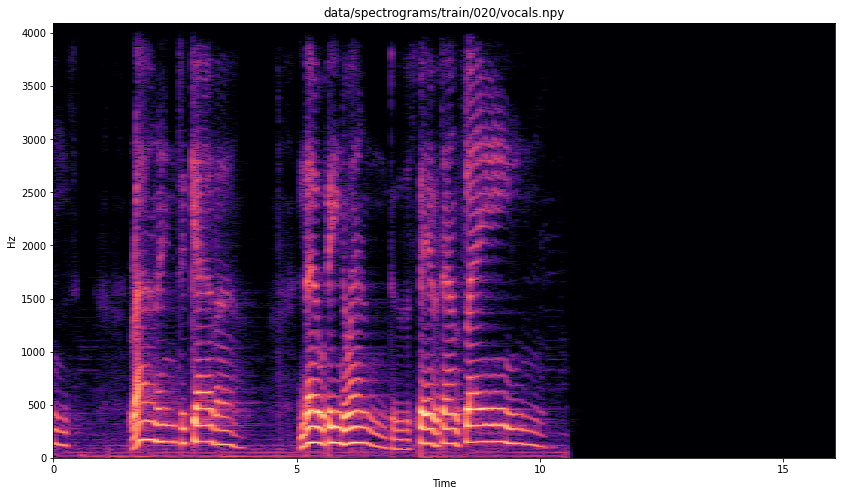

In [ ]:
display_spectrogram("data/spectrograms/train/020/mixture.npy")
display_spectrogram("data/spectrograms/train/020/bass.npy")
display_spectrogram("data/spectrograms/train/020/drums.npy")
display_spectrogram("data/spectrograms/train/020/other.npy")
display_spectrogram("data/spectrograms/train/020/vocals.npy")

In [ ]:
def explore_data():
    mixture = np.load("data/spectrograms/train/000/mixture.npy")
    print(f"max = {np.max(mixture)}, min = {np.min(mixture)}")
explore_data()

max = 90.22436464137131, min = 2.934097912327127e-06


# **Goal: separate vocals!**

Given a spectrogram matrix, want to predict the vocals mask matrix.

$L(X, Y, \theta) = || f(X, \theta) \cdot X - Y ||_{1, 1}$

$L_{1, 1}(A) = \sum_{i, j} |a_{ij}|$

In [2]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
print(tf.config.list_physical_devices('GPU'))
print(tf.test.is_built_with_cuda())

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
True


Model: "stupid_unet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 1024, 256)]  0                                            
__________________________________________________________________________________________________
reshape_36 (Reshape)            (None, 1024, 256, 1) 0           input_20[0][0]                   
__________________________________________________________________________________________________
conv2d_163 (Conv2D)             (None, 1024, 256, 16 416         reshape_36[0][0]                 
__________________________________________________________________________________________________
conv2d_164 (Conv2D)             (None, 512, 128, 32) 12832       conv2d_163[0][0]                 
________________________________________________________________________________________

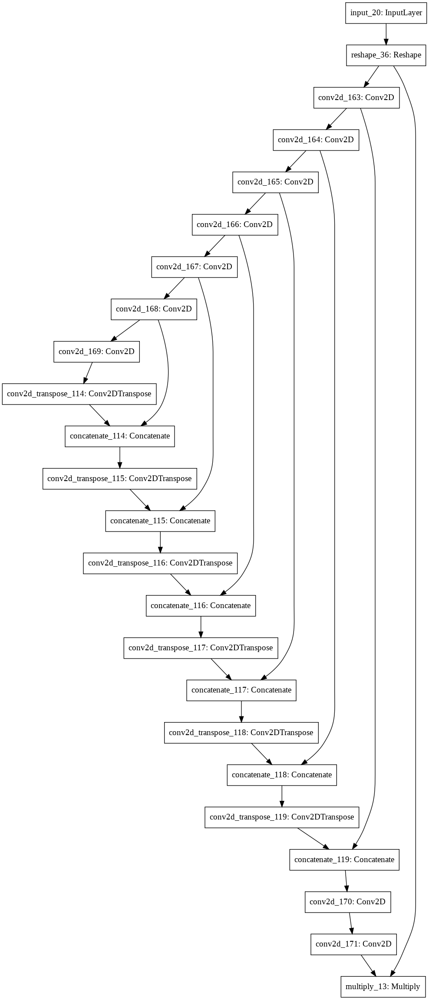

In [65]:
from pathlib import Path
import keras.backend as K


inputs = keras.Input(shape=(1024, 256))
first = layers.Reshape(target_shape=(1024, 256, 1))(inputs)
down1024 = layers.Conv2D(filters=16, kernel_size=5, strides=1, padding="same", activation="relu")(first)
down512 = layers.Conv2D(filters=32, kernel_size=5, strides=2, padding="same", activation="relu")(down1024)
down256 = layers.Conv2D(filters=64, kernel_size=5, strides=2, padding="same", activation="relu")(down512)
down128 = layers.Conv2D(filters=128, kernel_size=5, strides=2, padding="same", activation="relu")(down256)
down64 = layers.Conv2D(filters=256, kernel_size=5, strides=2, padding="same", activation="relu")(down128)
down32 = layers.Conv2D(filters=512, kernel_size=5, strides=2, padding="same", activation="relu")(down64)
down16 = layers.Conv2D(filters=1024, kernel_size=5, strides=2, padding="same", activation="relu")(down32)

up32 = layers.Conv2DTranspose(filters=512, kernel_size=5, strides=2, padding="same", activation="relu")(down16)
up32_concatted = layers.Concatenate()([down32, up32])

up64 = layers.Conv2DTranspose(filters=256, kernel_size=5, strides=2, padding="same", activation="relu")(up32_concatted)
up64_concatted = layers.Concatenate()([down64, up64])

up128 = layers.Conv2DTranspose(filters=128, kernel_size=5, strides=2, padding="same", activation="relu")(up64_concatted)
up128_concatted = layers.Concatenate()([down128, up128])

up256 = layers.Conv2DTranspose(filters=64, kernel_size=5, strides=2, padding="same", activation="relu")(up128_concatted)
up256_concatted = layers.Concatenate()([down256, up256])

up512 = layers.Conv2DTranspose(filters=32, kernel_size=5, strides=2, padding="same", activation="relu")(up256_concatted)
up512_concatted = layers.Concatenate()([down512, up512])

up1024 = layers.Conv2DTranspose(filters=16, kernel_size=5, strides=2, padding="same", activation="relu")(up512_concatted)
up1024_concatted = layers.Concatenate()([down1024, up1024])

final = layers.Conv2D(filters=1, activation="relu", kernel_size=5, strides=1, padding="same")(up1024_concatted)
sigmoid = layers.Conv2D(filters=1, activation="relu", kernel_size=1, strides=1, padding="same")(final)
outputs = layers.Multiply()([first, sigmoid])

result = layers.Reshape(target_shape=(1024, 256))(sigmoid)
model = keras.Model(inputs=inputs, outputs=outputs, name="stupid_unet")

model.summary()
keras.utils.plot_model(model, "notebooks/stupid_unet.png")

In [72]:
import random


def crop_matrix(matrix):
    while matrix.shape[0] > 1024:
        matrix = np.delete(matrix, -1, axis=0)
    while matrix.shape[1] > 256:
        matrix = np.delete(matrix, -1, axis=1)
    return matrix


def data_generator(set_name, size, batch_size):
    train_path = "data/spectrograms/" + set_name
    inputs = []
    targets = []
    batch_count = 0
    while True:
        track_id = random.randint(0, size - 1)
        path = Path(train_path) / str(track_id).zfill(3)
        mixture = np.load(path / "mixture.npy")
        vocals = np.load(path / "vocals.npy")

        mixture = crop_matrix(mixture)
        if np.max(mixture) > 1e-8:
            mixture = mixture / np.max(mixture)
        vocals = crop_matrix(vocals) 
        if np.max(vocals) > 1e-8:
            vocals = vocals / np.max(vocals)

        inputs.append(mixture)
        targets.append(vocals)
        batch_count += 1

        if batch_count == batch_size:
            yield np.array(inputs), np.array(targets)
            inputs = []
            targets = []
            batch_count =   0

    
def sum_offset(y_true, y_pred):
    return K.sum(K.abs(y_pred - y_true))

def mean_offset(y_true, y_pred):
    return K.mean(K.abs(y_pred - y_true))

def max_offset(y_true, y_pred):
    return K.max(K.abs(y_pred - y_true))


train_size = 160
batch_size = 10
steps_per_epoch = train_size / batch_size
epochs = 3
model.compile(
    optimizer="adam",
    loss=sum_offset,
    metrics=[sum_offset, mean_offset, max_offset],
)

model.fit(x=data_generator("train", 160, batch_size), steps_per_epoch=steps_per_epoch, epochs=epochs, verbose=1)
model.save("models/stupid_unet")

test_size = 40
model.evaluate(x=data_generator("test", 40, batch_size), steps=5, verbose=1)

Epoch 1/3
16/16 [==============================] - 4s 263ms/step - loss: 22118.7656 - sum_offset: 22118.7676 - mean_offset: 0.0084 - max_offset: 1.0000
Epoch 2/3
16/16 [==============================] - 4s 261ms/step - loss: 25346.4805 - sum_offset: 25346.4805 - mean_offset: 0.0097 - max_offset: 1.0000
Epoch 3/3
16/16 [==============================] - 4s 263ms/step - loss: 30148.5898 - sum_offset: 30148.5957 - mean_offset: 0.0115 - max_offset: 1.0000
INFO:tensorflow:Assets written to: models/stupid_unet/assets
5/5 [==============================] - 1s 153ms/step - loss: 16591.1055 - sum_offset: 16591.1055 - mean_offset: 0.0063 - max_offset: 1.0000


[16591.10546875, 16591.10546875, 0.006329004652798176, 1.0]

In [22]:
model.save("models/fixed_stupid_unet")

INFO:tensorflow:Assets written to: models/fixed_stupid_unet/assets


In [7]:
import random


def generate_matrix(height, width, min_value, max_value):
    return np.array([[random.uniform(min_value, max_value) for _ in range(width)] for _ in range(height)])


def diff(lhs, rhs):
    return np.sum(np.abs(lhs - rhs))


target = crop_matrix(np.load("data/spectrograms/test/013/vocals.npy"))
random_matrix = generate_matrix(1024, 256, 0., np.max(target))
print(diff(random_matrix, target))

zeros = np.zeros(shape=(1024, 256))
print(diff(zeros, target))

8784334.50880699
54050.52194950896


In [ ]:
%tensorboard --logdir "models/logs/fit"

Output hidden; open in https://colab.research.google.com to view.

In [73]:
input = crop_matrix(np.load("data/spectrograms/test/013/mixture.npy"))
print("input")
print(input.shape)
print(np.max(input))
print(np.min(input))
print(np.mean(input))

factor = np.max(input)
input /= factor

input = tf.convert_to_tensor(input)
input = tf.reshape(input, (-1, 1024, 256))
result = model.predict(input, batch_size=1)
print("result")
print(result.shape)
print(np.max(result))
print(np.min(result))
print(np.mean(result))

result = result * factor
print("result")
print(result.shape)
print(np.max(result))
print(np.min(result))
print(np.mean(result))

input
(1024, 256)
55.37306030964269
4.0906177618364575e-06
1.0027254866097444
result
(1, 1024, 256, 1)
0.0
0.0
0.0
result
(1, 1024, 256, 1)
0.0
0.0
0.0
